# Part A: Hybrid Image

## Overview

A hybrid image is the sum of a *low-pass filtered* version of the one image and a *high-pass filtered* version of a second image. There is a free parameter, which can be tuned for each image pair, which controls how much high frequency to remove from the first image and how much low frequency to leave in the second image. This is called the “cutoff-frequency”. 

## Data


In [ ]:
# Download Data -- run this cell only one time per runtime
!gdown 1KTDxPAkQam29YKtoX5dKPnLKpUOWCanC
!unzip "/content/hybrid_pyramid_input.zip" -d "/content/"

Downloading...
From: https://drive.google.com/uc?id=1KTDxPAkQam29YKtoX5dKPnLKpUOWCanC
To: /content/hybrid_pyramid_input.zip
100% 2.19M/2.19M [00:00<00:00, 48.8MB/s]
Archive:  /content/hybrid_pyramid_input.zip
   creating: /content/data/
  inflating: /content/data/Afghan_girl_before.jpg  
  inflating: /content/data/motorcycle.bmp  
  inflating: /content/data/cat.bmp   
  inflating: /content/data/makeup_before.jpg  
  inflating: /content/data/fish.bmp  
  inflating: /content/data/bicycle.bmp  
  inflating: /content/data/makeup_after.jpg  
  inflating: /content/data/plane.bmp  
  inflating: /content/data/marilyn.bmp  
  inflating: /content/data/dog.bmp   
  inflating: /content/data/Afghan_girl_after.jpg  
  inflating: /content/data/submarine.bmp  
  inflating: /content/data/bird.bmp  
  inflating: /content/data/einstein.bmp  


## Code

In [ ]:
# Helper Functions

def vis_hybrid_image(hybrid_image):
  scales = 5
  scale_factor = 0.5
  padding = 5
  original_height = hybrid_image.shape[0]
  num_colors = hybrid_image.shape[2] # counting how many color channels the input has
  output = hybrid_image
  cur_image = hybrid_image

  for i in range(2, scales):
      # add padding
      output = np.concatenate((output, np.ones((original_height, padding, num_colors), dtype=int)), axis=1)      
      # dowsample image;
      width = int(cur_image.shape[1] * scale_factor)
      height = int(cur_image.shape[0] * scale_factor)
      dim = (width, height)
      cur_image = cv2.resize(cur_image, dim, interpolation = cv2.INTER_LINEAR)
      # pad the top and append to the output
      tmp = np.concatenate((np.ones((original_height-cur_image.shape[0], cur_image.shape[1], num_colors)), cur_image), axis=0)
      output = np.concatenate((output, tmp), axis=1)
  
  output = (output * 255).astype(np.uint8)
  return output
  
def read_image(image_path):
  image = cv2.imread(image_path)	
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  gray = np.array(gray)
  return gray

def gaussian_2D_filter(size, cutoff_frequency):
  ax = np.linspace(-(size - 1) / 2., (size - 1) / 2., size)
  gauss = np.exp(-0.5 * np.square(ax) / np.square(cutoff_frequency))
  kernel = np.outer(gauss, gauss) 
  return kernel / np.sum(kernel)

def imgfilter(image, filter):
  img = cv2.filter2D(image, -1, filter)
  return img

def log_mag_FFT(image):
  fft_matrix = np.log(np.abs(np.fft.fftshift(np.fft.fft2(image))))
  return (np.uint8(fft_matrix))

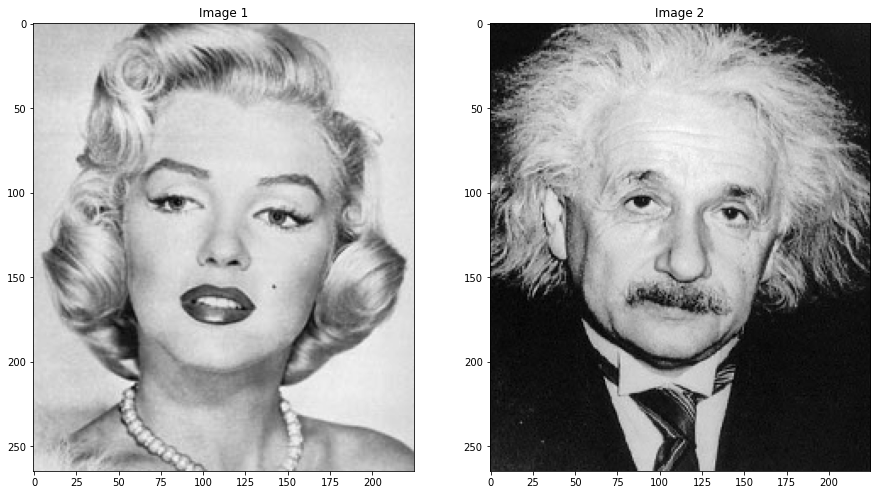

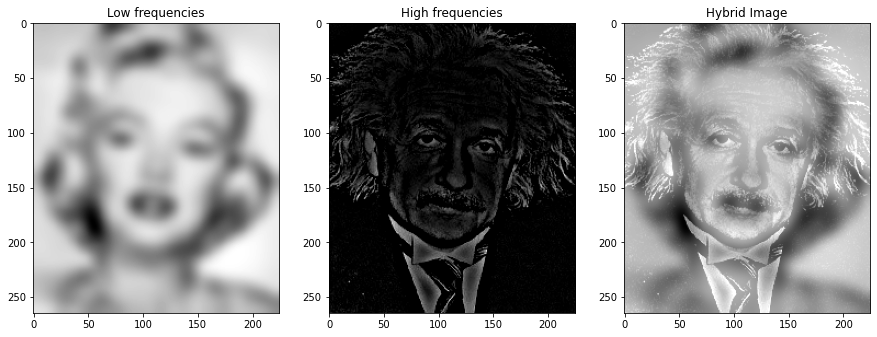

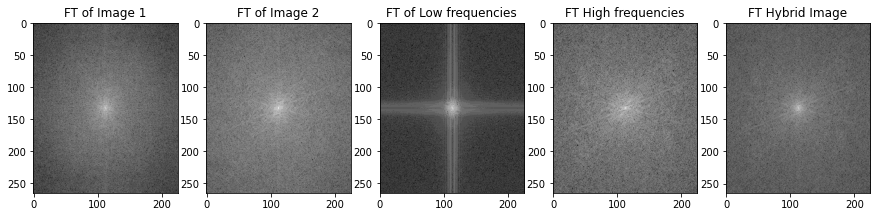

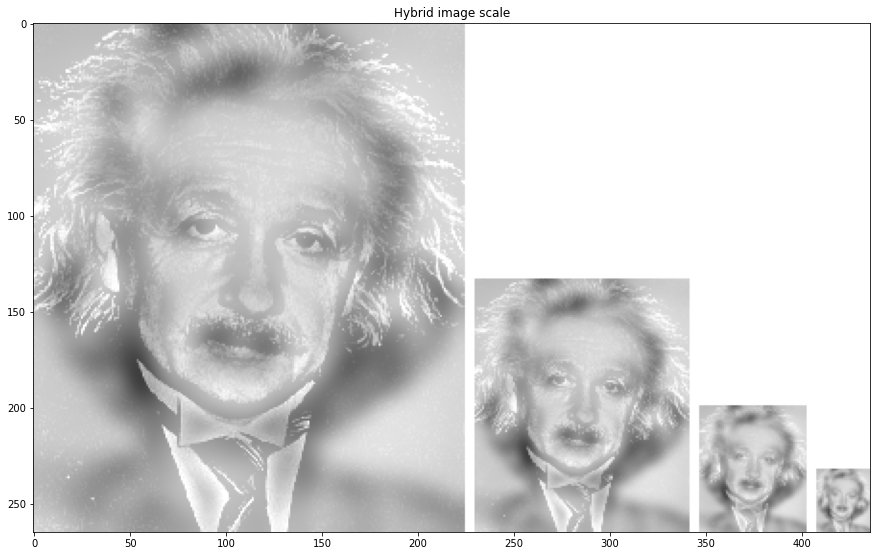

In [ ]:
# Import necessary packages here
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

image_path1 = 'data/marilyn.bmp'
image_path2 = 'data/einstein.bmp'

image_1 = read_image(image_path1)
image_2 = read_image(image_path2)

fig, ax = plt.subplots(1, 2, figsize=(15, 15))
ax[0].imshow(image_1, cmap = 'gray')
ax[1].imshow(image_2, cmap = 'gray')
ax[0].set_title('Image 1')
ax[1].set_title('Image 2')
plt.savefig('PartA_original_images.png')

# TUNE cutoff_frequency
cutoff_frequency = 6
filter_size = cutoff_frequency*4+1
"""cutoff_frequency is the standard deviation, in pixels, of the 
Gaussian blur that will remove the high frequencies from one image (image_1) and 
remove the low frequencies from another image (image_2) """

filter = gaussian_2D_filter(filter_size, cutoff_frequency)
#plt.imshow( filter, cmap = 'gray')

"""Use imgfilter() to create 'low_frequencies' and 'high_frequencies' and then combine them to create 'hybrid_image'.
Remove the high frequencies from image_1 by blurring it. The amount of blur that works best will vary with different image pairs."""

blurred_image1 = imgfilter(image_1, filter=filter)

low_frequencies = blurred_image1

"""Remove the low frequencies from image_2. The easiest way to do this is to
subtract a blurred version of image_2 from the original version of image_2.
This will give you an image centered at zero with negative values."""

high_frequencies = cv2.subtract(image_2 , imgfilter(image_2, filter = filter))

"""Combine the high frequencies and low frequencies to obtain hybrid_image."""

hybrid_image= cv2.add(low_frequencies, high_frequencies)

"""Firstly, visualize low_frequencies, high_frequencies, and the hybrid image."""

fig1, ax1 = plt.subplots(1, 3, figsize=(15, 15))
ax1[0].imshow(low_frequencies, cmap = 'gray')
ax1[1].imshow(high_frequencies, cmap = 'gray')
ax1[2].imshow(hybrid_image, cmap = 'gray')
ax1[0].set_title('Low frequencies')
ax1[1].set_title('High frequencies')
ax1[2].set_title('Hybrid Image')
plt.savefig('PartA_LFHF_hybrid.png')

"""visualize log magnitude of Fourier Transform of the above."""

fig2, ax2 = plt.subplots(1, 5, figsize=(15, 15))
ax2[0].imshow(log_mag_FFT(image_1), cmap ='gray')
ax2[1].imshow(log_mag_FFT(image_2), cmap = 'gray')
ax2[2].imshow(log_mag_FFT(low_frequencies), cmap = 'gray')
ax2[3].imshow(log_mag_FFT(high_frequencies), cmap = 'gray')
ax2[4].imshow(log_mag_FFT(hybrid_image), cmap = 'gray')
ax2[0].set_title('FT of Image 1')
ax2[1].set_title('FT of Image 2')
ax2[2].set_title('FT of Low frequencies')
ax2[3].set_title('FT High frequencies')
ax2[4].set_title('FT Hybrid Image')
plt.savefig('PartA_FT.png')



"""visualize hybrid_image_scale using helper function vis_hybrid_image.
Lastly, save all your outputs."""

colored= cv2.cvtColor(hybrid_image, cv2.COLOR_GRAY2BGR)
fig3, ax3 = plt.subplots(1, 1, figsize= (15, 15))
ax3.imshow(vis_hybrid_image(colored *255))
ax3.set_title('Hybrid image scale')
plt.savefig('PartA_hybrid_scale.png')

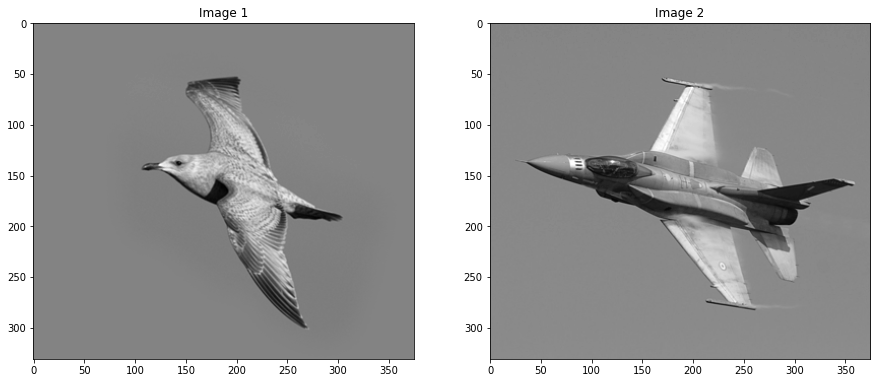

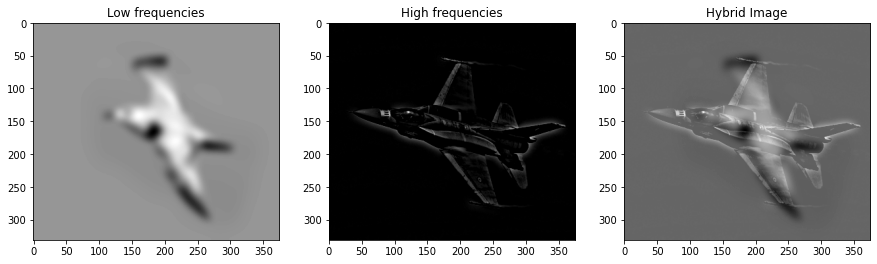

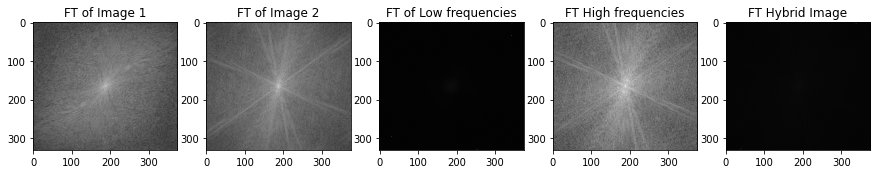

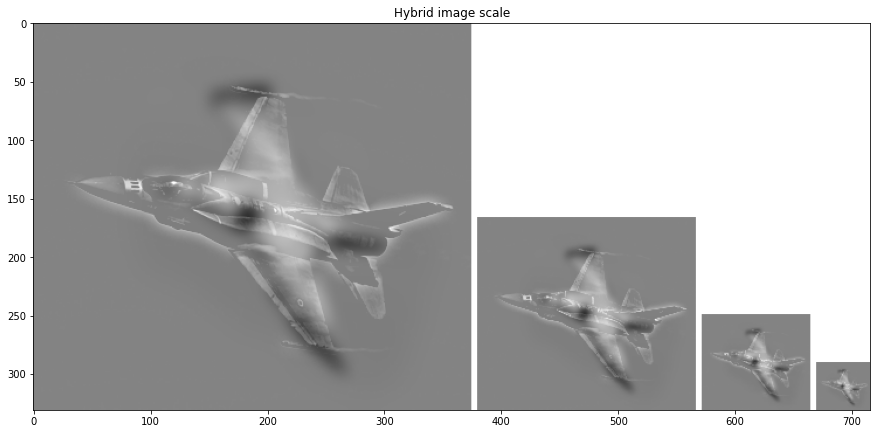

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

image_path1 = 'data/bird.bmp'
image_path2 = 'data/plane.bmp'

image_1 = read_image(image_path1)
image_2 = read_image(image_path2)

fig, ax = plt.subplots(1, 2, figsize=(15, 15))
ax[0].imshow(image_1, cmap = 'gray')
ax[1].imshow(image_2, cmap = 'gray')
ax[0].set_title('Image 1')
ax[1].set_title('Image 2')
plt.savefig('PartA_original_images1.png')

#  TUNE cutoff_frequency
cutoff_frequency = 6
filter_size = cutoff_frequency*4+1
"""cutoff_frequency is the standard deviation, in pixels, of the 
Gaussian blur that will remove the high frequencies from one image (image_1) and 
remove the low frequencies from another image (image_2) (to do so, subtract a blurred
version from the original version). You will want to tune this for every image pair to get the best results."""

filter = gaussian_2D_filter(filter_size, cutoff_frequency)
#plt.imshow( filter, cmap = 'gray')

"""Use imgfilter() to create 'low_frequencies' and 'high_frequencies' and then combine them to create 'hybrid_image'.
Remove the high frequencies from image_1 by blurring it. The amount of blur that works best will vary with different image pairs."""

blurred_image1 = imgfilter(image_1, filter=filter)
#  .
low_frequencies = blurred_image1

"""Remove the low frequencies from image_2. The easiest way to do this is to
subtract a blurred version of image_2 from the original version of image_2.
This will give you an image centered at zero with negative values."""

#  
high_frequencies = cv2.subtract(image_2 , imgfilter(image_2, filter = filter))

"""Combine the high frequencies and low frequencies to obtain hybrid_image."""
#  
hybrid_image= cv2.add(low_frequencies, high_frequencies)

"""Firstly, visualize low_frequencies, high_frequencies, and the hybrid image."""
#  .
fig1, ax1 = plt.subplots(1, 3, figsize=(15, 15))
ax1[0].imshow(low_frequencies, cmap = 'gray')
ax1[1].imshow(high_frequencies, cmap = 'gray')
ax1[2].imshow(hybrid_image, cmap = 'gray')
ax1[0].set_title('Low frequencies')
ax1[1].set_title('High frequencies')
ax1[2].set_title('Hybrid Image')
plt.savefig('PartA_LFHF_hybrid1.png')

"""Secondly, also visualize log magnitude of Fourier Transform of the above.
HINT: You may use np.log(np.abs(np.fft.fftshift(np.fft.fft2(image)))) to achieve it."""

fig2, ax2 = plt.subplots(1, 5, figsize=(15, 15))
ax2[0].imshow(log_mag_FFT(image_1), cmap ='gray')
ax2[1].imshow(log_mag_FFT(image_2), cmap = 'gray')
ax2[2].imshow(log_mag_FFT(low_frequencies), cmap = 'gray')
ax2[3].imshow(log_mag_FFT(high_frequencies), cmap = 'gray')
ax2[4].imshow(log_mag_FFT(hybrid_image), cmap = 'gray')
ax2[0].set_title('FT of Image 1')
ax2[1].set_title('FT of Image 2')
ax2[2].set_title('FT of Low frequencies')
ax2[3].set_title('FT High frequencies')
ax2[4].set_title('FT Hybrid Image')
plt.savefig('PartA_FT1.png')
#  .


"""Thirdly, visualize hybrid_image_scale using helper function vis_hybrid_image.
Lastly, save all your outputs."""
#  .
colored= cv2.cvtColor(hybrid_image, cv2.COLOR_GRAY2BGR)
fig3, ax3 = plt.subplots(1, 1, figsize= (15, 15))
ax3.imshow(vis_hybrid_image(colored *255))
ax3.set_title('Hybrid image scale')
plt.savefig('PartA_hybrid_scale1.png')

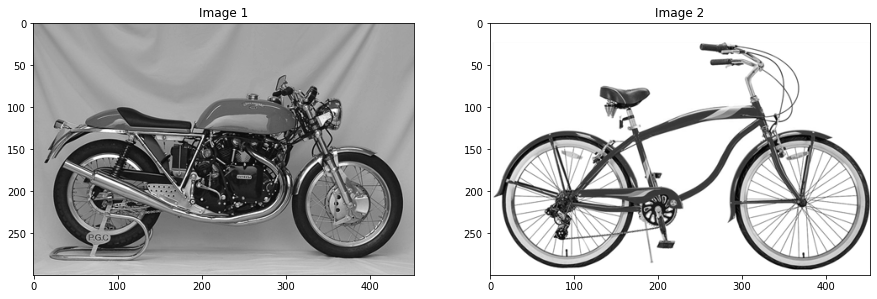

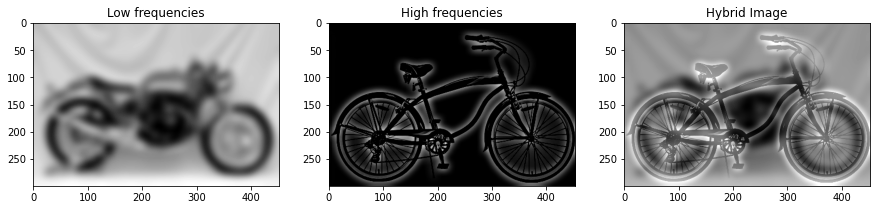

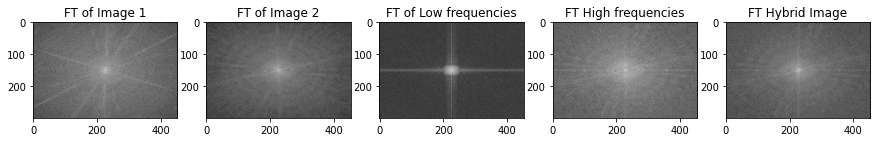

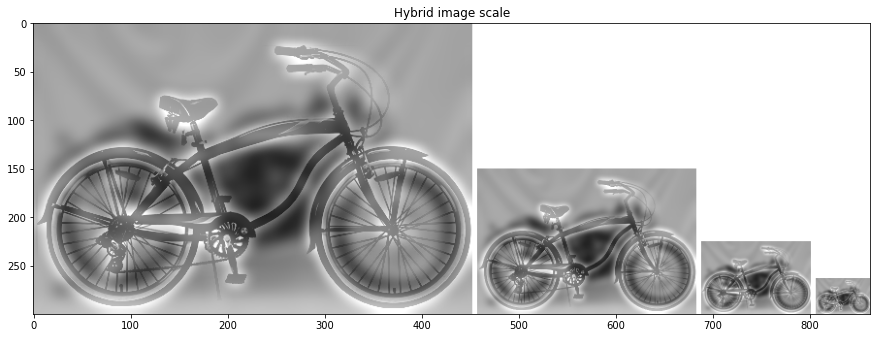

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

image_path2 = 'data/bicycle.bmp'
image_path1 = 'data/motorcycle.bmp'

image_1 = read_image(image_path1)
image_2 = read_image(image_path2)

fig, ax = plt.subplots(1, 2, figsize=(15, 15))
ax[0].imshow(image_1, cmap = 'gray')
ax[1].imshow(image_2, cmap = 'gray')
ax[0].set_title('Image 1')
ax[1].set_title('Image 2')
plt.savefig('PartA_original_images2.png')

#  TUNE cutoff_frequency
cutoff_frequency = 7
filter_size = cutoff_frequency*4+1
"""cutoff_frequency is the standard deviation, in pixels, of the 
Gaussian blur that will remove the high frequencies from one image (image_1) and 
remove the low frequencies from another image (image_2) (to do so, subtract a blurred
version from the original version). You will want to tune this for every image pair to get the best results."""

filter = gaussian_2D_filter(filter_size, cutoff_frequency)
#plt.imshow( filter, cmap = 'gray')

"""Use imgfilter() to create 'low_frequencies' and 'high_frequencies' and then combine them to create 'hybrid_image'.
Remove the high frequencies from image_1 by blurring it. The amount of blur that works best will vary with different image pairs."""

blurred_image1 = imgfilter(image_1, filter=filter)
#  .
low_frequencies = blurred_image1

"""Remove the low frequencies from image_2. The easiest way to do this is to
subtract a blurred version of image_2 from the original version of image_2.
This will give you an image centered at zero with negative values."""

#  
high_frequencies = cv2.subtract(image_2 , imgfilter(image_2, filter = filter))

"""Combine the high frequencies and low frequencies to obtain hybrid_image."""
#  
hybrid_image= cv2.add(low_frequencies, high_frequencies)

"""Firstly, visualize low_frequencies, high_frequencies, and the hybrid image."""
#  .
fig1, ax1 = plt.subplots(1, 3, figsize=(15, 15))
ax1[0].imshow(low_frequencies, cmap = 'gray')
ax1[1].imshow(high_frequencies, cmap = 'gray')
ax1[2].imshow(hybrid_image, cmap = 'gray')
ax1[0].set_title('Low frequencies')
ax1[1].set_title('High frequencies')
ax1[2].set_title('Hybrid Image')
plt.savefig('PartA_LFHF_hybrid2.png')

"""Secondly, also visualize log magnitude of Fourier Transform of the above.
HINT: You may use np.log(np.abs(np.fft.fftshift(np.fft.fft2(image)))) to achieve it."""

fig2, ax2 = plt.subplots(1, 5, figsize=(15, 15))
ax2[0].imshow(log_mag_FFT(image_1), cmap ='gray')
ax2[1].imshow(log_mag_FFT(image_2), cmap = 'gray')
ax2[2].imshow(log_mag_FFT(low_frequencies), cmap = 'gray')
ax2[3].imshow(log_mag_FFT(high_frequencies), cmap = 'gray')
ax2[4].imshow(log_mag_FFT(hybrid_image), cmap = 'gray')
ax2[0].set_title('FT of Image 1')
ax2[1].set_title('FT of Image 2')
ax2[2].set_title('FT of Low frequencies')
ax2[3].set_title('FT High frequencies')
ax2[4].set_title('FT Hybrid Image')
plt.savefig('PartA_FT2.png')
#  .


"""Thirdly, visualize hybrid_image_scale using helper function vis_hybrid_image.
Lastly, save all your outputs."""
#  .
colored= cv2.cvtColor(hybrid_image, cv2.COLOR_GRAY2BGR)
fig3, ax3 = plt.subplots(1, 1, figsize= (15, 15))
ax3.imshow(vis_hybrid_image(colored *255))
ax3.set_title('Hybrid image scale')
plt.savefig('PartA_hybrid_scale2.png')




To create a hybrid image, two images are needed whose hybrid is to be found. The image which should be visible when you are at a low distance from the hybrid image should be passed through a high pass filter to find its edges. Next, the other image which shoud be visible when you are at a larger distance from the hybrid image should be passed through a low pass filter. These two images, namely high and low frequency images should then be added to get the final hybrid image. Consider the example wher a hybrid image of einstein and marilyn are created. 

The image 1 is passed through the low pass filter and image 2 through the high pass filter. The resuling images added together give the hybrid image. For filtering the cut off frequency used was 6.

It can be seen how filtering by low pass filter removes information along the center of the fourier transform while high pass filter does the opposite.


# Part B: Pyramid Image with Laplacian & Gaussian Pyramid

## Data



In [ ]:
# Download Data -- run this cell only one time per runtime
!gdown 1KTDxPAkQam29YKtoX5dKPnLKpUOWCanC
!unzip "/content/hybrid_pyramid_input.zip" -d "/content/"

Downloading...
From: https://drive.google.com/uc?id=1KTDxPAkQam29YKtoX5dKPnLKpUOWCanC
To: /content/hybrid_pyramid_input.zip
100% 2.19M/2.19M [00:00<00:00, 155MB/s]
Archive:  /content/hybrid_pyramid_input.zip
replace /content/data/Afghan_girl_before.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

## Code

In [ ]:
from numpy.core.memmap import uint8
from PIL import Image
from PIL import ImageChops
# Populate Helper Functions:

def pyramidsGL(image, num_levels):
  #''' Creates Gaussian (G) and Laplacian (L) pyramids of level "num_levels" from image im. 
  #G and L are list where G[i], L[i] stores the i-th level of Gaussian and Laplacian pyramid, respectively. '''

  
  G = [image, ]
  L = []
  cutoff_frequency = 2
  filter_size = cutoff_frequency*4+1
  filter = gaussian_2D_filter(filter_size, cutoff_frequency)

  def decimate(image):
    
    # Blur
    g_blurred = imgfilter(image, filter)
    # Downsample
    g_decimated = g_blurred[::2, ::2]
    # print("decimated image")
    # print(g_decimated.shape)
    return g_decimated

  def interpolate(image):
    # Initialize empty image
    image_up = np.zeros((2*image.shape[0], 2*image.shape[1]), dtype = uint8)
    # Upsample
    image_up[::2, ::2] = image
    image_interpolated = imgfilter(image_up, filter)

    # print("interpolated image shape")
    # print(image_interpolated.shape)
    return image_interpolated
  
  # Build the Gaussian pyramid 
  for i in range(num_levels):
    image = decimate(image)
    G.append(image)
    
  # Build the Laplacian pyramid
  for i in range(len(G) - 1):
    h, w= G[i].shape
    G_interpolated= interpolate(G[i + 1])
    temp= cv2.subtract(G[i], G_interpolated[:h, :w])
    L.append(temp)
  return G[:-1], L

def displayPyramids(G, L):
  '''Role of this function is to display intensity and Fast Fourier Transform (FFT) images of pyramids.
  NOTE: You may re-use your helper function  "log_mag_FFT" to compute this.'''
  #  
  num_images = len(G)

  fig, ax = plt.subplots(1, num_images, figsize=(30, 4))
  fig.suptitle('Gaussian Pyramid', fontsize=15)
  for i in range(num_images):
    ax[i].imshow((G[i]*255), cmap='gray')
  plt.savefig('PartB_GaussianPyr.png')

  fig1, ax1 = plt.subplots(1, num_images, figsize=(30, 4))
  fig1.suptitle('Laplacian Pyramid', fontsize=15)
  for i in range(num_images):
    ax1[i].imshow((L[i]*255), cmap='gray')
  plt.savefig('PartB_LaplacianPyr.png')

  fig2, ax2 = plt.subplots(1, num_images, figsize=(30, 4))
  fig2.suptitle('FT of Gaussian Pyramid', fontsize=15)
  for i in range(num_images):
    ax2[i].imshow(log_mag_FFT(G[i]*255), cmap='gray')
  plt.savefig('PartB_FT_of_Gaussian.png')

  fig3, ax3 = plt.subplots(1, num_images, figsize=(30, 4))
  fig3.suptitle('FT of Laplacian Pyramid', fontsize=15)
  for i in range(num_images):
    ax3[i].imshow(log_mag_FFT(L[i]*255), cmap='gray')
  plt.savefig('PartB_FT_of_Laplacian.png')

  return


def reconstructLaplacianPyramid(L):
  '''Given a Laplacian Pyramid L, reconstruct an image img.'''
  #   
  cutoff_frequency=2
  filter_size = cutoff_frequency*4+1
  filter = gaussian_2D_filter(filter_size, cutoff_frequency)

  def interpolate(image):
    # Initialize empty image
    image_up = np.zeros((2*image.shape[0], 2*image.shape[1]), dtype = uint8)
    # Upsample
    image_up[::2, ::2] = image
    image_interpolated = imgfilter(image_up, filter)
    return image_interpolated

  scale = len(L)
  up = L[-1]

  for i in range(scale-1,0,-1):
      up = interpolate(up)
      old = L[i-1]
      h, w = old.shape
      up = cv2.add(old, up[:h, :w])
  return up



L2 norm error value
1445.925309274307


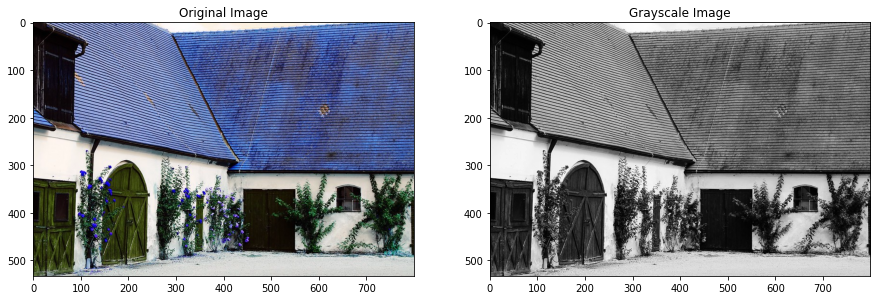

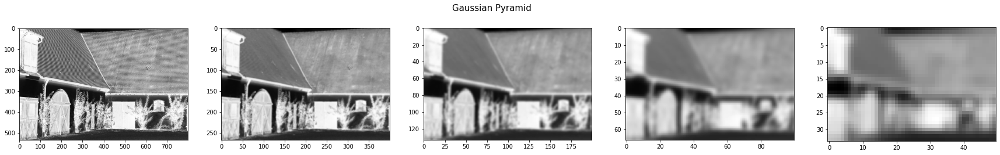

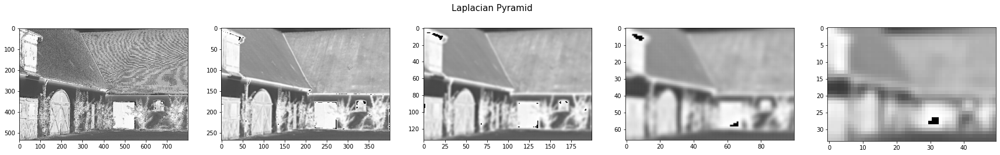

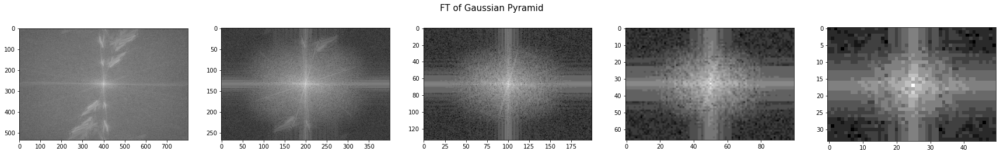

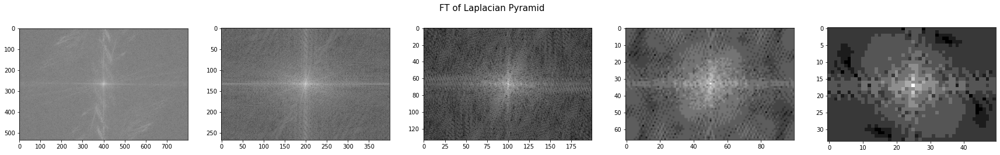

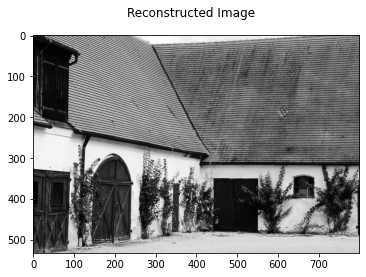

In [ ]:
""" 
Steps:
1. Load an image im.
2. Call function pyramidsGL with image and num_levels = 5
3. Call function displayPyramids with G, L
4. Call function reconstructLaplacianPyramid with the generated L
5. Compute reconstruction error with L2 norm and print the error value.
"""
image = cv2.imread('villa.jpg')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
fig, ax = plt.subplots(1, 2, figsize = (15, 15))
ax[0].imshow(image)
ax[0].set_title('Original Image')
ax[1].imshow(gray, cmap ='gray')
ax[1].set_title('Grayscale Image')
plt.savefig('PartB_OrignialImage.png')


G, L= pyramidsGL(gray, num_levels = 5)

displayPyramids(G, L)

I = reconstructLaplacianPyramid(L)
error = np.sqrt(np.sum(np.square(np.array(I) - np.array(gray))))
print("L2 norm error value")
print(error)

fig1, ax1 = plt.subplots(1, 1)
ax1.imshow(I, cmap ='gray')
fig1.suptitle("Reconstructed Image")
plt.savefig('PartB_ReconstructedImage.png')




The	elements	of	a	Gaussian	Pyramids	are	smoothed	copies	of	the	
image	at	different	scales. The Laplacian pyramids are the differences in these copies. As we move to the highter levels of the pyramid, the details in the image get smoothed out. Large uniform regions in the image are preserved, which is evident through the FFT images,as the central region of the FFT grows larger.


At each level of the Laplacian pyramid, residuals are retained instead of the blurred image which helps in reconstruction of the original image. Practically, during reconstruction, some informatio is lost as during processing some dimensions of the image are adjused to get the reconstruction.


# Part C: Edge detection 

## Data


In [ ]:
# Download Data -- run this cell only one time per runtime
!gdown 1zgblBWTQ847yZKnRmM1QrRiEWu1WvEo7
!unzip "/content/edge_detection_inputs.zip" -d "/content/"

Downloading...
From: https://drive.google.com/uc?id=1zgblBWTQ847yZKnRmM1QrRiEWu1WvEo7
To: /content/edge_detection_inputs.zip
100% 3.82M/3.82M [00:00<00:00, 128MB/s]
Archive:  /content/edge_detection_inputs.zip
   creating: /content/edge_detection_inputs/
  inflating: /content/edge_detection_inputs/65033.jpg  
  inflating: /content/edge_detection_inputs/21077.jpg  
  inflating: /content/edge_detection_inputs/41033.jpg  
  inflating: /content/edge_detection_inputs/12084.jpg  
  inflating: /content/edge_detection_inputs/108082.jpg  
  inflating: /content/edge_detection_inputs/38082.jpg  
  inflating: /content/edge_detection_inputs/45096.jpg  
  inflating: /content/edge_detection_inputs/42049.jpg  
  inflating: /content/edge_detection_inputs/89072.jpg  
  inflating: /content/edge_detection_inputs/69020.jpg  
  inflating: /content/edge_detection_inputs/103070.jpg  
  inflating: /content/edge_detection_inputs/38092.jpg  
  inflating: /content/edge_detection_inputs/85048.jpg  
  inflating: /c

In [ ]:
# Import necessary packages
import numpy as np
import cv2
from google.colab.patches import cv2_imshow ## Use this to show image in colab

img_path = "/content/edge_detection_inputs/101085.jpg" ## add the path here
img = cv2.imread(img_path)
#plt.imshow(img)

## Subpart 1: Simple edge detection


In [ ]:
def gradientMagnitude(im, sigma):
  '''
  im: input image
  sigma: standard deviation value to smooth the image

  outputs: gradient magnitude and gradient direction of the image
  '''
  
  blurred_image = cv2.GaussianBlur(im, (5, 5), sigma)

  gx =[]
  gy = []
  for i in range(3):
    # Finding RGB gradients
    grad_x = cv2.Sobel(np.float32(blurred_image[:, :, i]), cv2.CV_64F, 1, 0, 3)
    gx.append(grad_x)
    grad_y = cv2.Sobel(np.float32(blurred_image[:, :, i]), cv2.CV_64F, 0, 1, 3)
    gy.append(grad_y)
  magnitude = []
  angle =[]
  for i in range(3):
    # Calculate mag and phase
    mag, ang = cv2.cartToPolar(gx[i], gy[i], angleInDegrees = True)
    magnitude.append(mag)
    angle.append(ang)
  size = im.shape
  #print(size[0])
  orientation = np.zeros((size[0], size[1]) )
  final_mag = np.zeros((size[0], size[1]))
  # print(len(magnitude))
  # print(im.shape)
  # print(orientation.shape)
  # print(final_mag.shape)
  for i in range(size[0]):
    for j in range(size[1]):
      n_list = [magnitude[0][i, j], magnitude[1][i, j], magnitude[2][i, j]]
      max_val = max(n_list)
      max_index = n_list.index(max_val)
      orientation[i, j] = angle[max_index][i, j]
      final_mag[i, j]= np.sqrt(np.square(magnitude[0][i, j]) + np.square(magnitude[1][i, j]) + np.square(magnitude[2][i, j]))

  return final_mag, orientation

def edgeGradient(magnitude, orientation):
  # Reference: https://www.adeveloperdiary.com/data-science/computer-vision/implement-canny-edge-detector-using-python-from-scratch/
  '''
  im: magnitude, phase
  
  output: a soft boundary map of the image
  '''
  ##  
  image_row, image_col = magnitude.shape
  output = np.zeros(magnitude.shape)
  PI = 180
  for row in range(1, image_row - 1):
    for col in range(1, image_col - 1):
        direction = orientation[row, col]
 
        if (0 <= direction < PI / 8) or (15 * PI / 8 <= direction <= 2 * PI):
            before_pixel = magnitude[row, col - 1]
            after_pixel = magnitude[row, col + 1]
 
        elif (PI / 8 <= direction < 3 * PI / 8) or (9 * PI / 8 <= direction < 11 * PI / 8):
            before_pixel = magnitude[row + 1, col - 1]
            after_pixel = magnitude[row - 1, col + 1]
 
        elif (3 * PI / 8 <= direction < 5 * PI / 8) or (11 * PI / 8 <= direction < 13 * PI / 8):
            before_pixel = magnitude[row - 1, col]
            after_pixel = magnitude[row + 1, col]
 
        else:
            before_pixel = magnitude[row - 1, col - 1]
            after_pixel = magnitude[row + 1, col + 1]
 
        if magnitude[row, col] >= before_pixel and magnitude[row, col] >= after_pixel:
            output[row, col] = magnitude[row, col]

  return output

# def edgeGradient(im):
#   '''
#   im: input image

#   output: a soft boundary map of the image
#   '''
#   ##  
#   im = (im).astype(np.uint8)
#   #im = im^0.7
#   output = cv2.Canny(im, 100, 200)
#   return output


## Subpart 2: Improved Edge Detection- Oriented Filters



In [ ]:

def orientedFilterMagnitude(im):
  '''
  im: magnitude, phase

  outputs: gradient magnitude and gradient direction of the image
  '''
  
  cutoff_frequency = 6
  filter_size = cutoff_frequency*4+1
  filter = gaussian_2D_filter(filter_size, cutoff_frequency)
  grad_x = cv2.Sobel(np.float32(filter), cv2.CV_64F, 1, 0, 3)
  grad_y = cv2.Sobel(np.float32(filter), cv2.CV_64F, 0, 1, 3)
  #print(grad_x.shape)
  x_filters= []
  y_filters= []
  for i in range(0,4,1):
    a = np.pi*(i)/4;
    x_f = np.cos(a)*grad_x
    y_f = np.sin(a)*grad_y
    x_filters.append(x_f)
    y_filters.append(y_f)

  # Display of filters
  fig, ax = plt.subplots(1, len(x_filters), figsize=(15,3))
  for i in range (len(x_filters)):
    ax[i].imshow((x_filters[i] + y_filters[i]), cmap='gray')
  fig.suptitle("Oriented Filters")
  plt.savefig('PartC_Oriented_filters.png')

  h, w, c= im.shape
  N=4
  mag = np.zeros((h,w,c));
  theta = np.zeros((h,w,c));
  mag_all = np.zeros((h,w,c,N));
  theta_all = np.zeros((h,w,c,N));
  #print(len(x_filters))
  for i in range(3):
    for k in range(4):
      #compute the filtered result along x and y
      img_fil_x = cv2.filter2D(im[:, :, i], -1, x_filters[k])   
      img_fil_y = cv2.filter2D(im[:, :, i], -1, y_filters[k]) 
      img_fil_mag = np.sqrt(np.square(img_fil_x) + np.square(img_fil_y))
      img_fil_theta = np.arctan2(img_fil_y, img_fil_x) * 180 / np.pi
      mag_all[:,:,i,k] = img_fil_mag;
      theta_all[:,:,i,k] = img_fil_theta;

    theta[:,:,i] = img_fil_theta;

  mag = np.max(mag_all,axis=3)
  img_mag = np.sqrt(np.square(mag[:, :, 0]) + np.square(mag[:, :, 1]) + np.square(mag[:, :, 2]))

  indices = np.argmax(mag, axis =2)
  theta_mag = np.zeros((h,w))

  for i in range(h):
    for j in range(w):
        theta_mag[i, j] = theta[i,j,indices[i,j]];


  return img_mag, theta_mag

def edgeOrientedFilters(magnitude, orientation):
  '''
  im: input image

  output: a soft boundary map of the image
  '''
  ##  
  image_row, image_col = magnitude.shape
  output = np.zeros(magnitude.shape)
  PI = 180
  for row in range(1, image_row - 1):
    for col in range(1, image_col - 1):
        direction = orientation[row, col]
 
        if (0 <= direction < PI / 8) or (15 * PI / 8 <= direction <= 2 * PI):
            before_pixel = magnitude[row, col - 1]
            after_pixel = magnitude[row, col + 1]
 
        elif (PI / 8 <= direction < 3 * PI / 8) or (9 * PI / 8 <= direction < 11 * PI / 8):
            before_pixel = magnitude[row + 1, col - 1]
            after_pixel = magnitude[row - 1, col + 1]
 
        elif (3 * PI / 8 <= direction < 5 * PI / 8) or (11 * PI / 8 <= direction < 13 * PI / 8):
            before_pixel = magnitude[row - 1, col]
            after_pixel = magnitude[row + 1, col]
 
        else:
            before_pixel = magnitude[row - 1, col - 1]
            after_pixel = magnitude[row + 1, col + 1]
 
        if magnitude[row, col] >= before_pixel and magnitude[row, col] >= after_pixel:
            output[row, col] = magnitude[row, col]

  return output




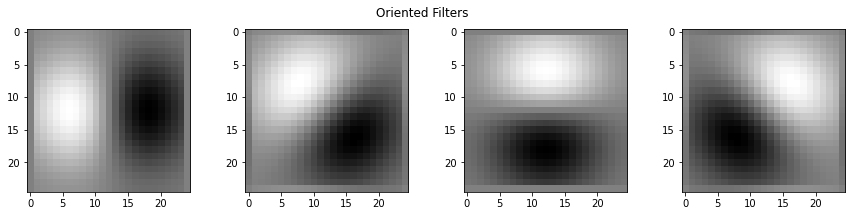

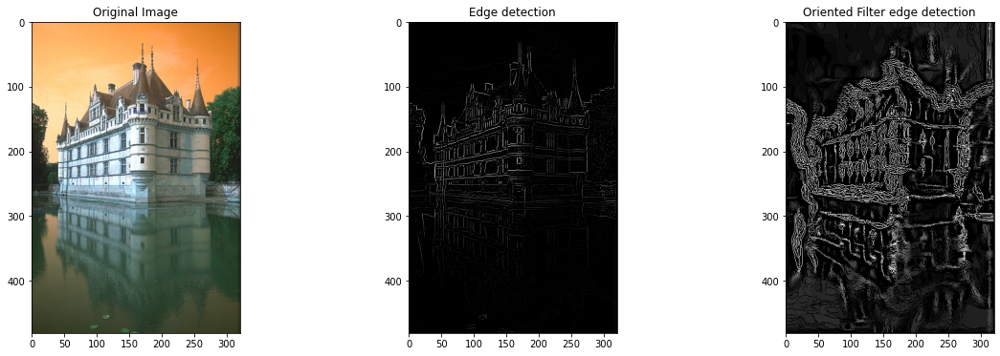

In [ ]:
image2 = cv2.imread('/content/edge_detection_inputs/102061.jpg')
mag, orientn= gradientMagnitude(image2, sigma=1.2)
output = edgeGradient(mag, orientn)
# output = edgeGradient(mag)

mag1, phase =orientedFilterMagnitude(image2)
out = edgeOrientedFilters(mag1, phase)
# out = edgeOrientedFilters(mag1)

fig, ax = plt.subplots(1, 3, figsize= (20, 6))
ax[0].imshow(image2)
ax[0].set_title("Original Image")
ax[1].imshow(output, cmap ='gray')
ax[1].set_title("Edge detection")
ax[2].imshow(out, cmap ='gray')
ax[2].set_title("Oriented Filter edge detection")
plt.savefig('PartC_EdgeDetection1.png')

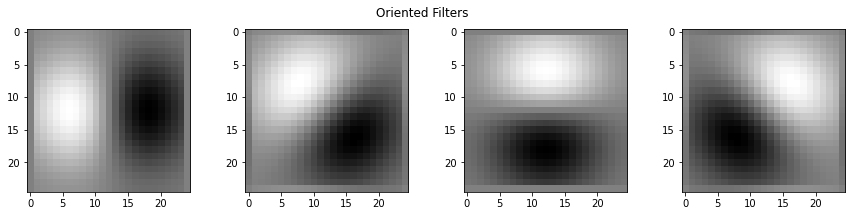

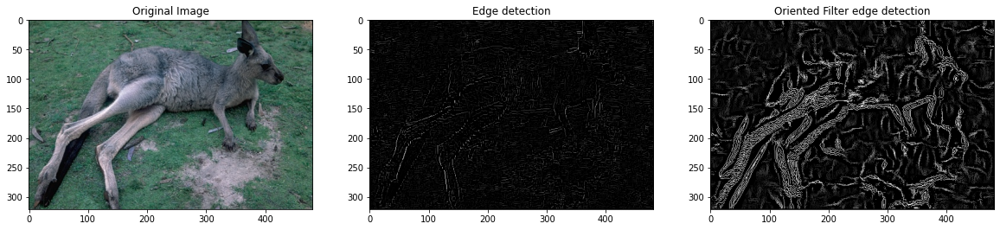

In [ ]:
image3 = cv2.imread('/content/edge_detection_inputs/69020.jpg')
mag, orientn= gradientMagnitude(image3, sigma=1.2)
output = edgeGradient(mag, orientn)

mag1, phase =orientedFilterMagnitude(image3)
out = edgeOrientedFilters(mag1, phase)

fig, ax = plt.subplots(1, 3, figsize= (20, 6))
ax[0].imshow(image3)
ax[0].set_title("Original Image")
ax[1].imshow(output, cmap ='gray')
ax[1].set_title("Edge detection")
ax[2].imshow(out, cmap ='gray')
ax[2].set_title("Oriented Filter edge detection")
plt.savefig('PartC_EdgeDetection2.png')

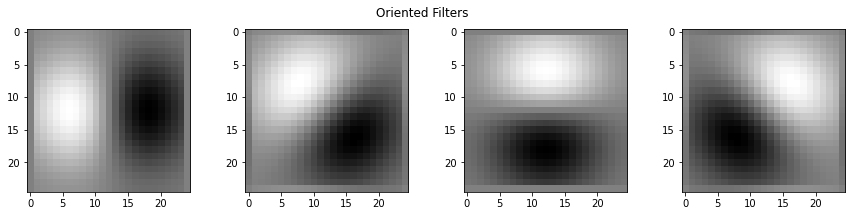

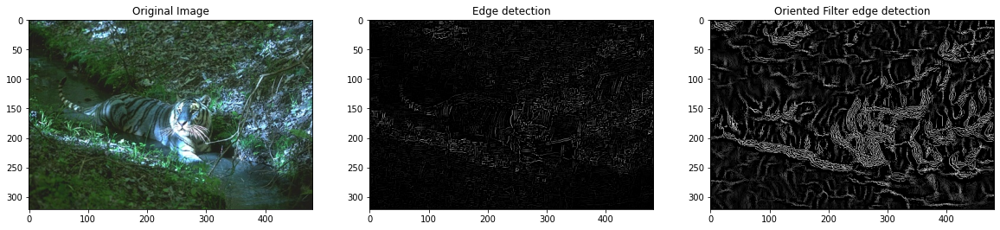

In [ ]:
image4 = cv2.imread('/content/edge_detection_inputs/108070.jpg')
mag, orientn= gradientMagnitude(image4, sigma=1.2)
output = edgeGradient(mag, orientn)

mag1, phase =orientedFilterMagnitude(image4)
out = edgeOrientedFilters(mag1, phase)

fig, ax = plt.subplots(1, 3, figsize= (20, 6))
ax[0].imshow(image4)
ax[0].set_title("Original Image")
ax[1].imshow(output, cmap ='gray')
ax[1].set_title("Edge detection")
ax[2].imshow(out, cmap ='gray')
ax[2].set_title("Oriented Filter edge detection")
plt.savefig('PartC_EdgeDetection3.png')

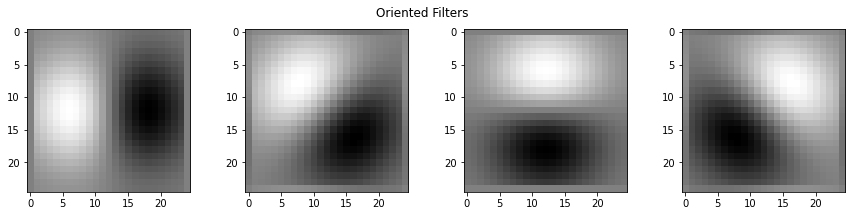

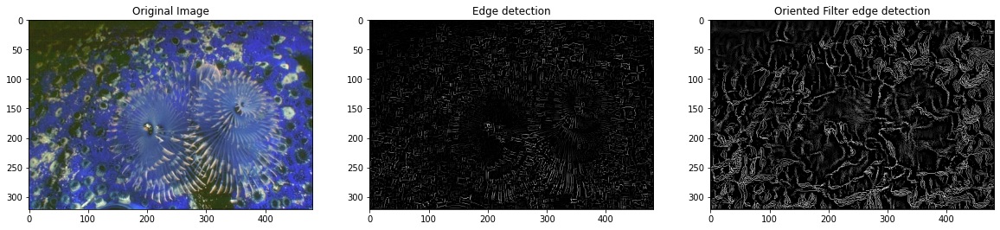

In [ ]:
image5 = cv2.imread('/content/edge_detection_inputs/12084.jpg')
mag, orientn= gradientMagnitude(image5, sigma=1.2)
output = edgeGradient(mag, orientn)

mag1, phase =orientedFilterMagnitude(image5)
out = edgeOrientedFilters(mag1, phase)

fig, ax = plt.subplots(1, 3, figsize= (20, 6))
ax[0].imshow(image5)
ax[0].set_title("Original Image")
ax[1].imshow(output, cmap ='gray')
ax[1].set_title("Edge detection")
ax[2].imshow(out, cmap ='gray')
ax[2].set_title("Oriented Filter edge detection")
plt.savefig('PartC_EdgeDetection4.png')

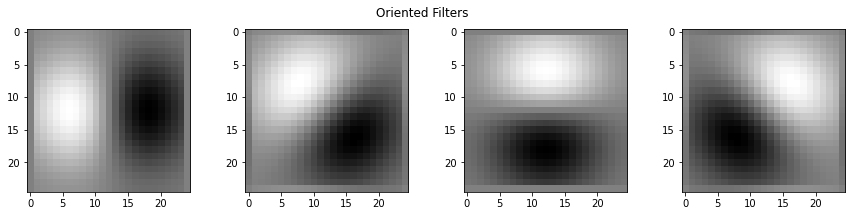

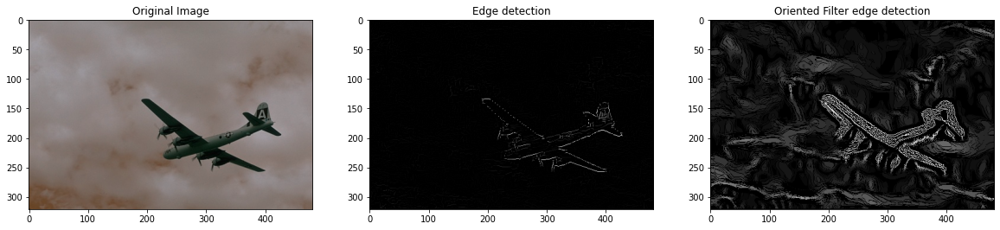

In [ ]:
image6 = cv2.imread('/content/edge_detection_inputs/3096.jpg')
mag, orientn= gradientMagnitude(image6, sigma=1.2)
output = edgeGradient(mag, orientn)

mag1, phase =orientedFilterMagnitude(image6)
out = edgeOrientedFilters(mag1, phase)

fig, ax = plt.subplots(1, 3, figsize= (20, 6))
ax[0].imshow(image6)
ax[0].set_title("Original Image")
ax[1].imshow(output, cmap ='gray')
ax[1].set_title("Edge detection")
ax[2].imshow(out, cmap ='gray')
ax[2].set_title("Oriented Filter edge detection")
plt.savefig('PartC_EdgeDetection5.png')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive




1.   For the blurring of the image in the gradientMaginitude function of part 1, a sigma value of 1.2 was chosen and a kernel size(5, 5) was chosen for blurring. For the oriented filter magnitude, a cutoff frequency of 6 was chosen for the creation of Gaussian kernel from part A. 
For the oriented filters implementation, four oriented filters were used, with the orientations of 0, 45,90 and 135 degrees.


2.   Bank of filters are visualized in the cells above.


3.   Qualitative results: visualized for 5 images above.


4.   One possible way of improving the output is adding some more oriented filters in the set of oriented filters. This would capture more edges from the original image which might get missed with the currently used 4 oriented filters. In the above code, two methods were experimented with for non-maxima threshold - using cv2.Canny function and using ththe interpolation method.Results for the interpolation method are implemented above as they gave the best results for the images tried.

# Part D: Template Matching

## Overview
The goal of this part is to build a template maching algorithm for where's waldo puzzle. 



## Data


In [ ]:
# Download Data -- run this cell only one time per runtime
!gdown 1_PHimFhPSajbTWzAL6-PwM803uzA7Ymb
!unzip "/content/Part4_data.zip" -d "/content/"

Downloading...
From: https://drive.google.com/uc?id=1_PHimFhPSajbTWzAL6-PwM803uzA7Ymb
To: /content/Part4_data.zip
100% 2.04M/2.04M [00:00<00:00, 41.4MB/s]
Archive:  /content/Part4_data.zip
   creating: /content/Part4_data/
  inflating: /content/__MACOSX/._Part4_data  
  inflating: /content/Part4_data/.DS_Store  
  inflating: /content/__MACOSX/Part4_data/._.DS_Store  
   creating: /content/Part4_data/puzzle2/
  inflating: /content/__MACOSX/Part4_data/._puzzle2  
   creating: /content/Part4_data/puzzle1/
  inflating: /content/__MACOSX/Part4_data/._puzzle1  
  inflating: /content/Part4_data/puzzle2/waldo.png  
  inflating: /content/__MACOSX/Part4_data/puzzle2/._waldo.png  
  inflating: /content/Part4_data/puzzle2/map.jpg  
  inflating: /content/__MACOSX/Part4_data/puzzle2/._map.jpg  
  inflating: /content/Part4_data/puzzle1/waldo.jpg  
  inflating: /content/__MACOSX/Part4_data/puzzle1/._waldo.jpg  
  inflating: /content/Part4_data/puzzle1/pic1.jpeg  
  inflating: /content/__MACOSX/Part4_d

## Code



In [ ]:
%matplotlib inline
import cv2
import numpy as np
import matplotlib.pyplot as plt

def plot_image(im,title,xticks=[],yticks= [],cv2 = True):
    """
    im :Image to plot
    title : Title of image 
    xticks : List of tick values. Defaults to nothing
    yticks :List of tick values. Defaults to nothing 
    cv2 :Is the image cv2 image? cv2 images are BGR instead of RGB. Default True
    """
    plt.figure()
    plt.imshow(im[:,:,::-1])
    plt.title(title)
    plt.xticks(xticks)
    plt.yticks(yticks)

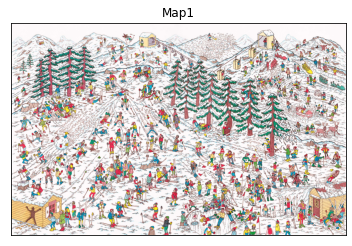

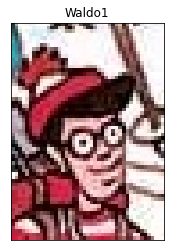

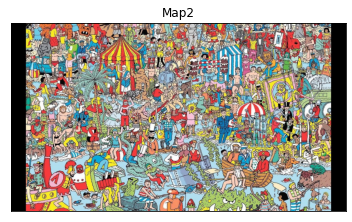

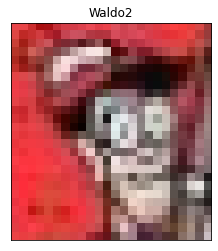

In [ ]:

# Puzzle 1
map1 = cv2.imread('/content/Part4_data/puzzle1/pic1.jpeg')
waldo1 = cv2.imread("/content/Part4_data/puzzle1/waldo.jpg")
map2 = cv2.imread("/content/Part4_data/puzzle2/map.jpg")
waldo2 = cv2.imread("/content/Part4_data/puzzle2/waldo.png")
plot_image(map1,'Map1')
plot_image(waldo1, 'Waldo1')
plot_image(map2, 'Map2')
plot_image(waldo2,'Waldo2')

### Subpart 1: Template Matching with OpenCV


(980, 56)
Wald's location (980, 56)


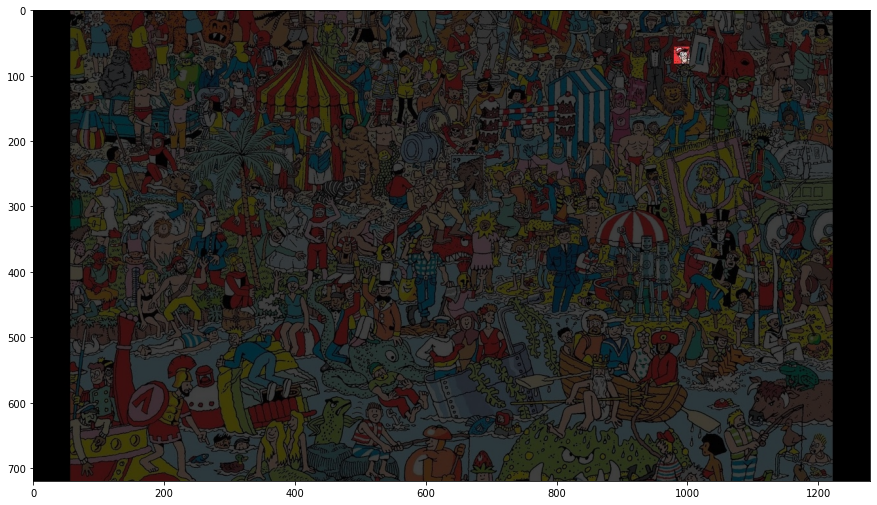

In [ ]:
(waldoHeight, waldoWidth) = waldo2.shape[:2]

result = cv2.matchTemplate(map2, waldo2, cv2.TM_SQDIFF)
(_, _, minLoc, maxLoc) = cv2.minMaxLoc(result)

# grab the bounding box of waldo and extract him from the puzzle image
print(minLoc)
topLeft = minLoc
print("Wald's location",topLeft)
botRight = (topLeft[0] + waldoWidth, topLeft[1] + waldoHeight)
roi = map2[topLeft[1] : botRight[1], topLeft[0] : botRight[0]]

# construct a darkened transparent 'layer' to darken everything
# in the map except for Waldo
mask = np.zeros(map2.shape, dtype = "uint8")
map = cv2.addWeighted(map2, 0.25, mask, 0.75, 0)

map[topLeft[1] : botRight[1], topLeft[0] : botRight[0]] = roi

# display the images
result_rgb = cv2.cvtColor(map, cv2.COLOR_RGB2BGR)
plt.figure(figsize = (15, 15))
plt.imshow(result_rgb)

### Subpart 2: Sum of Squared Distance (SSD) template matching algorithm 



In [ ]:
import math
from skimage import color

def norm_func(patch):
  new_img = np.zeros(patch.shape)
  for i in range(patch.shape[2]):
    norm = np.sum(patch[:,:,i]**2)
    norm = math.sqrt(norm)
    if norm == 0:
      norm = 1
    new_img[:,:,i] = patch[:,:,i] / norm
  return new_img

def ssd_func(patch, template):
  patch = norm_func(patch)
  template = norm_func(template)
  add_matrix = (patch-template)**2
  ssd_val = np.sum(add_matrix)
  return ssd_val

def wheres_waldo(map, template):
  # Finding dimensions
  map_width, map_height = map.shape[0], map.shape[1]
  temp_width, temp_height = template.shape[0], template.shape[1]
  stride = 1

  print("Image size:", map.shape)
  print("Template size:", template.shape)
  boundary_width = map_width - (temp_width)
  boundary_height = map_height - (temp_height)

  # Initializing
  min_dis = 1000000000.0
  x_location = -1
  y_location = -1

  for i in range(0,boundary_width,stride):
    if i%100 == 0:
        print("Processing row:", i)

    for j in range(0,boundary_height,stride):

      ## extract patch 
      temp = np.zeros((temp_width, temp_height,3)) 
      temp = map[i:i+temp_width, j:j+temp_height,:]

      ## find the Sum of Squared Distance of the patch and waldo template
      distance = ssd_func(temp, template)

      ## keep track with the minimum distance location
      if distance <= min_dis:
        min_dis = distance
        x_location = i 
        y_location = j

  return x_location, y_location

Image size: (1902, 3000, 3)
Template size: (61, 43, 3)
Processing row: 0
Processing row: 100
Processing row: 200
Processing row: 300
Processing row: 400
Processing row: 500
Processing row: 600
Processing row: 700
Processing row: 800
Processing row: 900
Processing row: 1000
Processing row: 1100
Processing row: 1200
Processing row: 1300
Processing row: 1400
Processing row: 1500
Processing row: 1600
Processing row: 1700
Processing row: 1800
Waldo's location (map1): 1341 2544


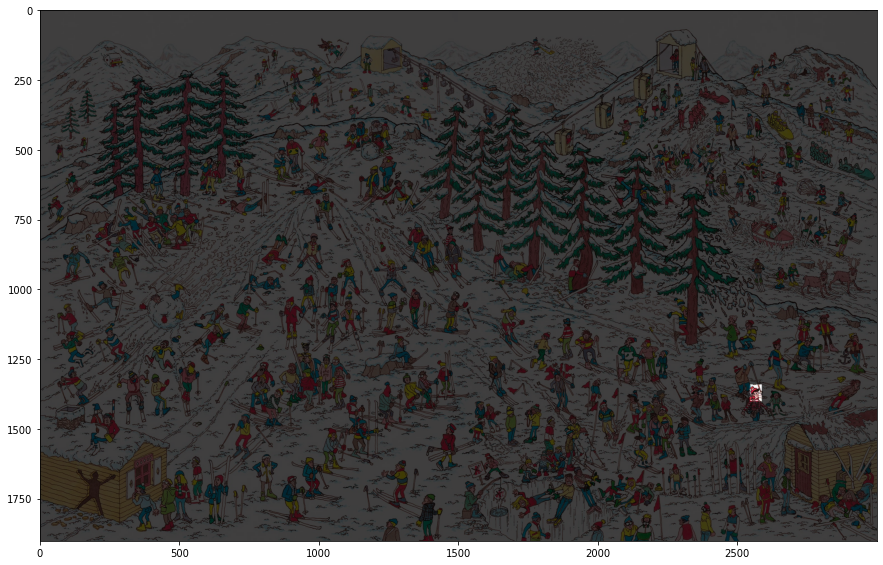

In [ ]:
x_location, y_location = wheres_waldo(map1, waldo1)
print("Waldo's location (map1):", x_location, y_location)
(waldoHeight, waldoWidth) = waldo1.shape[:2]
topLeft = [y_location, x_location]
botRight = (topLeft[0] + waldoWidth, topLeft[1] + waldoHeight)
roi = map1[topLeft[1] : botRight[1], topLeft[0] : botRight[0]]

# construct a darkened transparent 'layer' to darken everything
# in the map except for Waldo
mask = np.zeros(map1.shape, dtype = "uint8")
map = cv2.addWeighted(map1, 0.25, mask, 0.75, 0)

map[topLeft[1] : botRight[1], topLeft[0] : botRight[0]] = roi

# display the images
result_rgb = cv2.cvtColor(map, cv2.COLOR_RGB2BGR)
plt.figure(figsize = (15, 15))
plt.imshow(result_rgb)
plt.savefig('PardD_templatematching1.png')

Image size: (720, 1280, 3)
Template size: (26, 24, 3)
Processing row: 0
Processing row: 100
Processing row: 200
Processing row: 300
Processing row: 400
Processing row: 500
Processing row: 600
Waldo's location (map2): 56 980


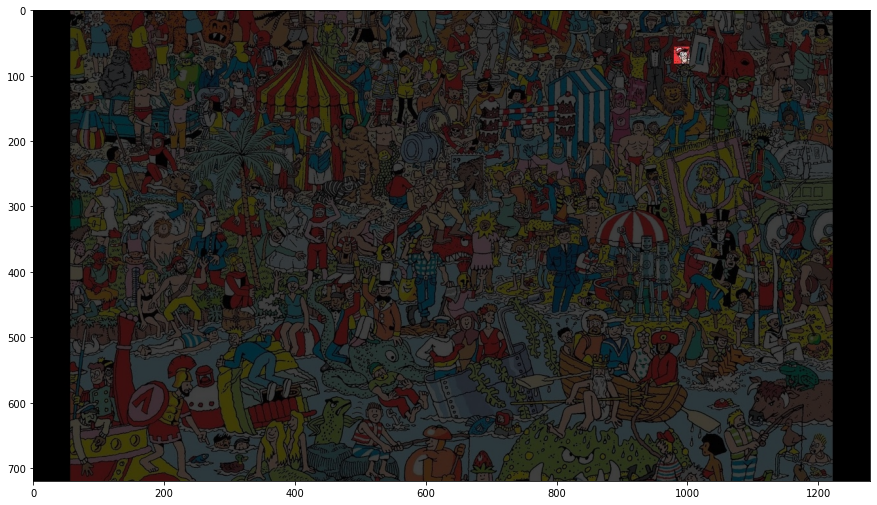

In [ ]:
x_location, y_location = wheres_waldo(map2, waldo2)
print("Waldo's location (map2):",x_location, y_location)
(waldoHeight, waldoWidth) = waldo2.shape[:2]
topLeft = [y_location, x_location]
botRight = (topLeft[0] + waldoWidth, topLeft[1] + waldoHeight)
roi = map2[topLeft[1] : botRight[1], topLeft[0] : botRight[0]]

# construct a darkened transparent 'layer' to darken everything
# in the map except for Waldo
mask = np.zeros(map2.shape, dtype = "uint8")
map = cv2.addWeighted(map2, 0.25, mask, 0.75, 0)

map[topLeft[1] : botRight[1], topLeft[0] : botRight[0]] = roi

# display the images
result_rgb = cv2.cvtColor(map, cv2.COLOR_RGB2BGR)
plt.figure(figsize = (15, 15))
plt.imshow(result_rgb)
plt.savefig('PardD_templatematching2.png')